<a href="https://colab.research.google.com/github/massirism/PDI-UNS/blob/main/TP6_Massiris.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Práctico 6 - Procesamiento Digital de Imágenes

In [1]:
import imageio
import numpy as np
import matplotlib.pyplot as plt

from skimage.feature import canny

%matplotlib inline

In [2]:
MAT_RGB2YIQ = np.array([[0.299, 0.587, 0.114],
                        [0.596,-0.275,-0.321],
                        [0.211,-0.523, 0.311]])

def apply_matrix(img, M):
    return np.matmul(img.reshape((-1,3)), M.T).reshape(img.shape)

def rgb2yiq(img):
    return apply_matrix(img, MAT_RGB2YIQ)

def yiq2rgb(img):
    return apply_matrix(img, np.linalg.inv(MAT_RGB2YIQ))


Imageio: 'camera.png' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/images/camera.png (136 kB)
Downloading: 8192/139512 bytes (5.9%)139512/139512 bytes (100.0%)
  Done
File saved as /root/.imageio/images/camera.png.


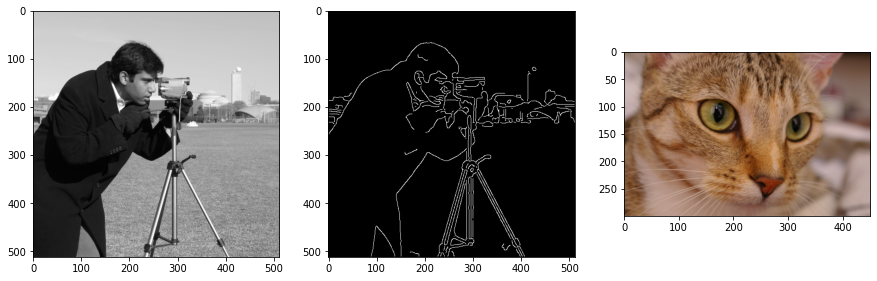

In [3]:
img_gray = imageio.imread('imageio:camera.png')/255
img_rgb = imageio.imread('imageio:chelsea.png')/255
# img_bin = canny(rgb2yiq(img_rgb)[:,:,0], sigma=2)
img_bin = canny(img_gray, sigma=2)

fig, axes = plt.subplots(1, 3, figsize=(15,5))
axes[0].imshow(img_gray, 'gray')
axes[1].imshow(img_bin, 'gray')
axes[2].imshow(img_rgb)

In [4]:
def _morph_op(img, se, fcn):
    '''Implements a general morphologic operation.'''
    se_flip = np.flip(se, axis=[0,1])
    rk, ck = se_flip.shape
    img_pad = np.pad(img, ((rk//2, rk//2), (ck//2, ck//2)), 'edge')
    img_out = np.zeros(img.shape)
    for r,c in np.ndindex(img.shape):
        img_out[r,c] = fcn(img_pad[r:r+rk,c:c+ck][se_flip])
    return img_out

def _morph_multiband(img, se, argfcn):
    '''Implements a general morphologic operation on a mutichannel image based on the first channel.'''
    se_flip = np.flip(se, axis=[0,1])
    rk, ck = se_flip.shape
    img_pad = np.pad(img, ((rk//2, rk//2), (ck//2, ck//2), (0,0)), 'edge')
    img_out = np.zeros(img.shape)
    rse, cse = np.where(se_flip)
    for r,c in np.ndindex(img.shape[:2]):
        loc = argfcn(img_pad[r:r+rk,c:c+ck,0][se_flip])
        img_out[r,c] = img_pad[r+rse[loc],c+cse[loc]]
    return img_out

def _morph_color(img, se, argfcn):
    '''Applies a morphological operation to a color image based on the 
    Y-channel.
    '''
    img2 = (rgb2yiq(img)[:, :, 0])[:, :, np.newaxis]
    img2 = np.concatenate((img2, img),axis=2)
    result = _morph_multiband(img2, se, argfcn)[:, :, 1:]
    return result

def im_dilate(img, se):
    '''Morphological dilation for binary, grayscale or RGB images.'''
    if img.ndim == 2:
        return _morph_op(img, se, np.max)
    else:
        return _morph_color(img, se, np.argmax)

In [5]:
se=np.ones((7,7), dtype=bool)

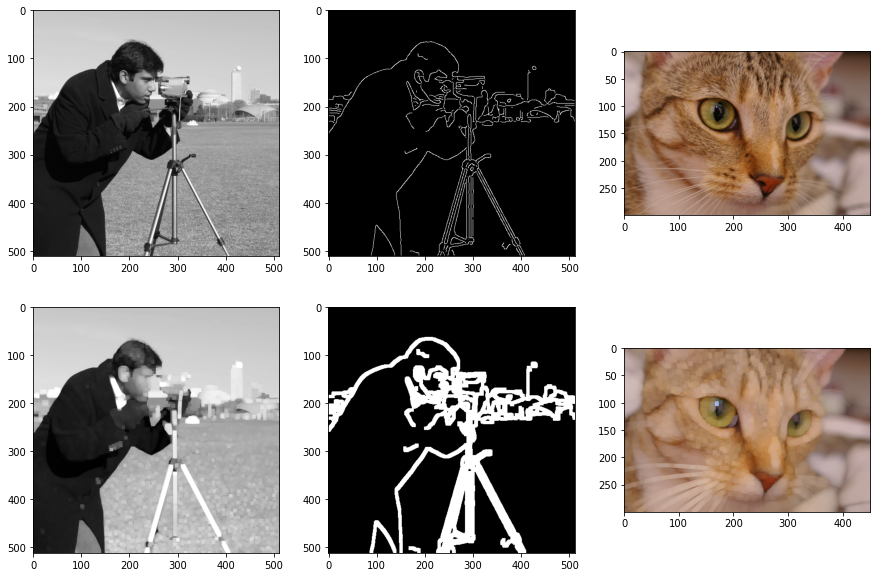

In [6]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(im_dilate(img_gray, se), 'gray')
axes[1,1].imshow(im_dilate(img_bin, se), 'gray')
axes[1,2].imshow(im_dilate(img_rgb, se))

#Elementos estructurales

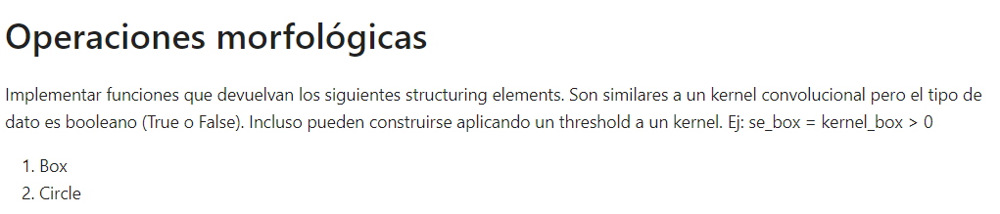

1. BOX

In [7]:
N=int(input("Ingrese la dimensión (N) : ")) 
while (N % 2 == 0):
  print("Pruebe con un número impar")
  N=int(input("Ingrese la dimensión (N) : "))


def Kernel_Box(N):
  dimensions=(N,N)
  kernel=np.ones(dimensions, np.float32)/(N*N)
  return kernel

kernel_box=Kernel_Box(N)
#print(kernel_box)

Ingrese la dimensión (N) : 9


In [8]:
se_box=kernel_box>0
print(se_box)

[[ True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True]]


2. Circle

In [9]:
def Kernel_Circle(N):
  radius=int(N/2)  #Si quieres que el kernel sea de 3*3-->radio=N/2.
  kernel=np.zeros((2*radius+1, 2*radius+1))
  y, x=np.ogrid[-radius:radius+1, -radius:radius+1]
  mask=x**2 + y**2 <= radius**2 #Mascara auxiliar para poder ubicar los 1
  kernel[mask]=1/(N*N)
  return kernel

kernel_circle=Kernel_Circle(N)
#print(kernel_circle)

In [10]:
se_circle=kernel_circle>0
print(se_circle)

[[False False False False  True False False False False]
 [False False  True  True  True  True  True False False]
 [False  True  True  True  True  True  True  True False]
 [False  True  True  True  True  True  True  True False]
 [ True  True  True  True  True  True  True  True  True]
 [False  True  True  True  True  True  True  True False]
 [False  True  True  True  True  True  True  True False]
 [False False  True  True  True  True  True False False]
 [False False False False  True False False False False]]


#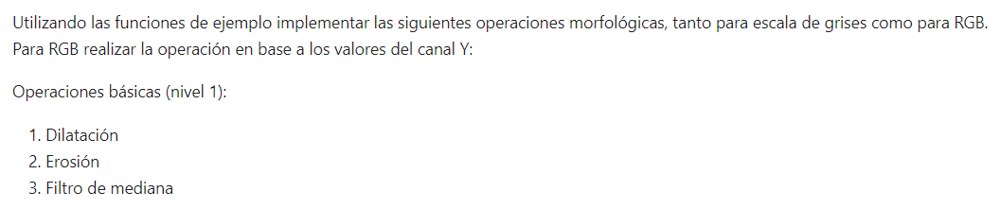

1. Dilatación

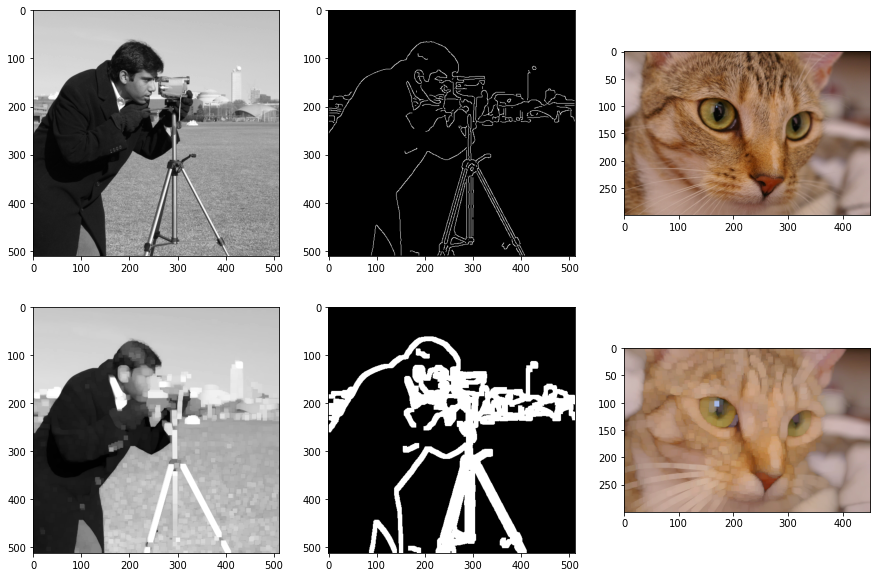

In [11]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(im_dilate(img_gray, se_box), 'gray')
axes[1,1].imshow(im_dilate(img_bin, se_box), 'gray')
axes[1,2].imshow(im_dilate(img_rgb, se_box))

2. Erosión

In [12]:
def im_erosion(img, se):
    '''Morphological erosion for binary, grayscale or RGB images.'''
    if img.ndim == 2:
        return _morph_op(img, se, np.min)
    else:
        return _morph_color(img, se, np.argmin)

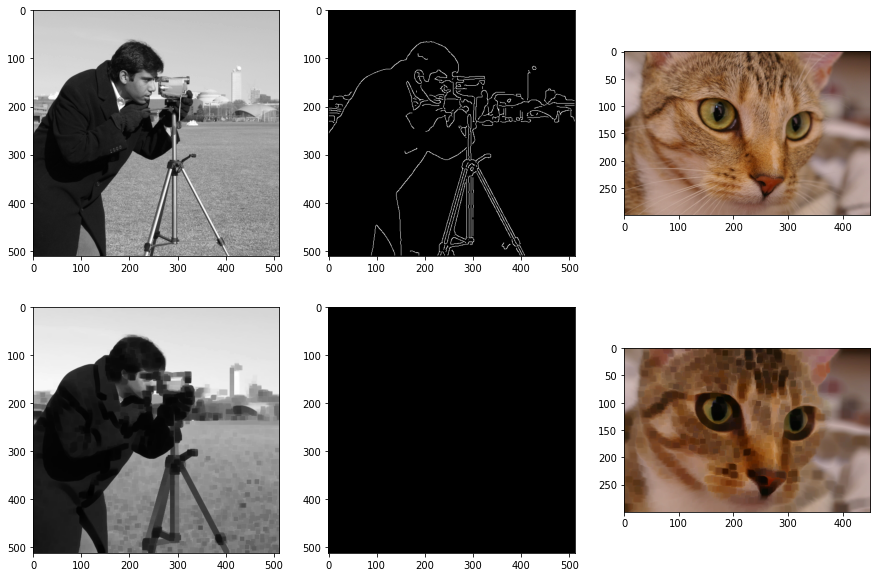

In [13]:
#Muestreo
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(im_erosion(img_gray, se_box), 'gray')
axes[1,1].imshow(im_erosion(img_bin, se_box), 'gray')
axes[1,2].imshow(im_erosion(img_rgb, se_box))

3. Filtro de mediana

In [14]:
def mediana(N):
  aux=np.argsort(N)
  aux=aux[len(N)//2]
  return aux

def filtro_mediana(img,se):
    if img.ndim == 2:
        return _morph_op(img, se, np.median)
    else:
        return _morph_color(img, se, mediana)

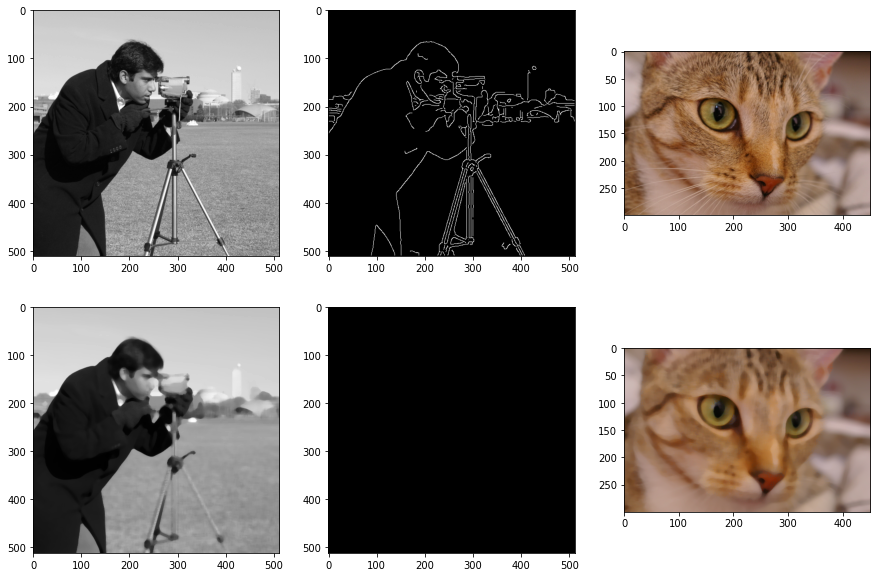

In [15]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(filtro_mediana(img_gray, se_box), 'gray')
axes[1,1].imshow(filtro_mediana(img_bin, se_box), 'gray')
axes[1,2].imshow(filtro_mediana(img_rgb, se_box))

#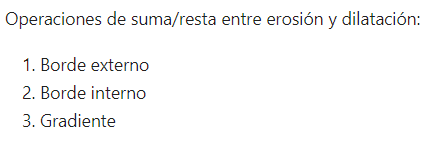

1. Borde externo (dilatación menos original)

In [16]:
def borde_externo(img,se):
  aux=im_dilate(img,se)-img
  return aux

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


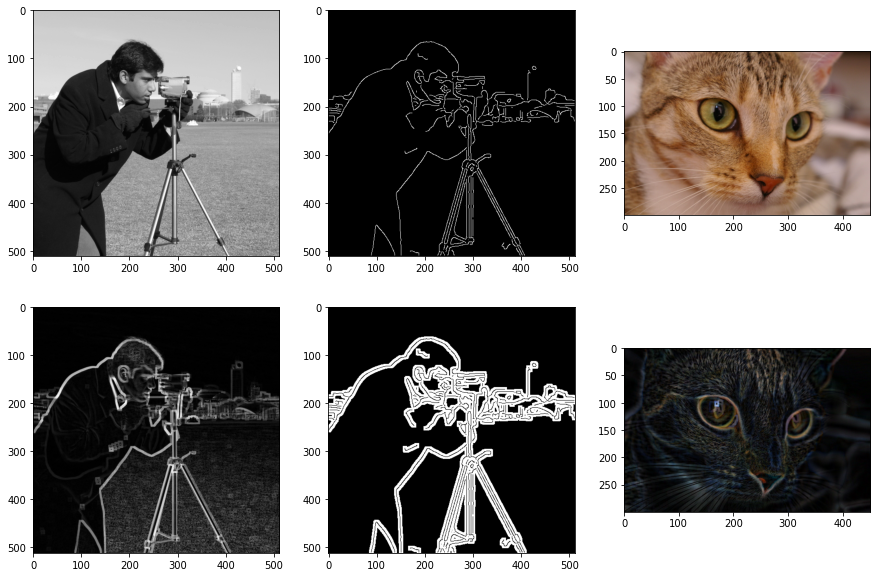

In [17]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(borde_externo(img_gray, se_box), 'gray')
axes[1,1].imshow(borde_externo(img_bin, se_box), 'gray')
axes[1,2].imshow(borde_externo(img_rgb, se_box))

2. Borde interior (original menos erosión)

In [18]:
def borde_interno(img,se):
  aux=img-im_erosion(img,se)
  return aux

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


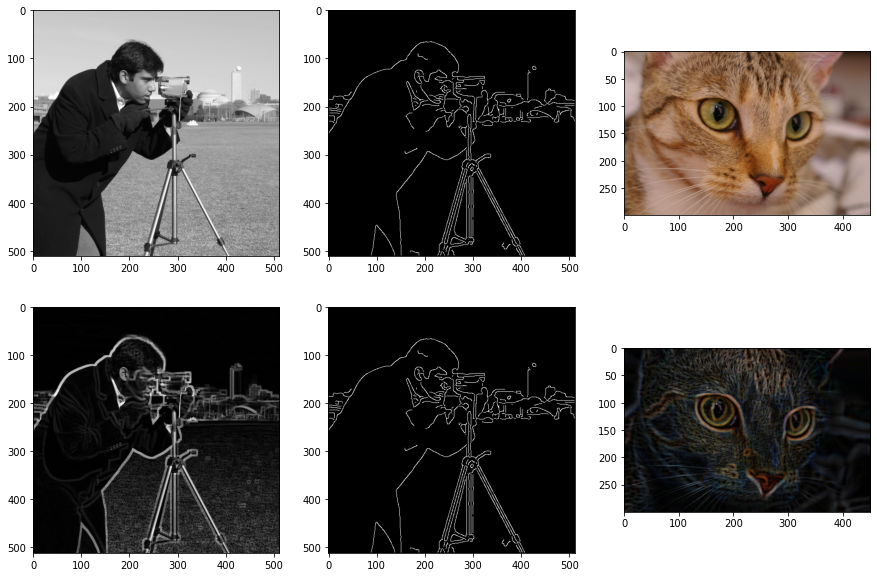

In [19]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(borde_interno(img_gray, se_box), 'gray')
axes[1,1].imshow(borde_interno(img_bin, se_box), 'gray')
axes[1,2].imshow(borde_interno(img_rgb, se_box))

3. Gradiente (dilatación menos erosión)

In [20]:
def gradiente(img,se):
  aux=im_dilate(img,se)-im_erosion(img,se)
  return aux

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


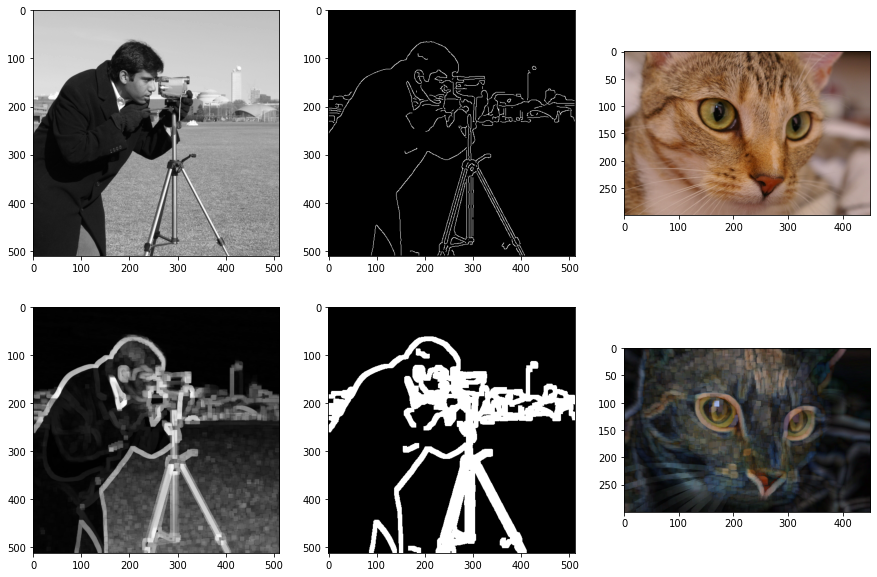

In [21]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(gradiente(img_gray, se_box), 'gray')
axes[1,1].imshow(gradiente(img_bin, se_box), 'gray')
axes[1,2].imshow(gradiente(img_rgb, se_box))

#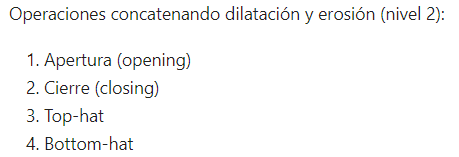

1. Apertura (opening,erosión seguida por dilatación)

In [22]:
def apertura(img,se):
  return im_dilate(im_erosion(img,se),se)

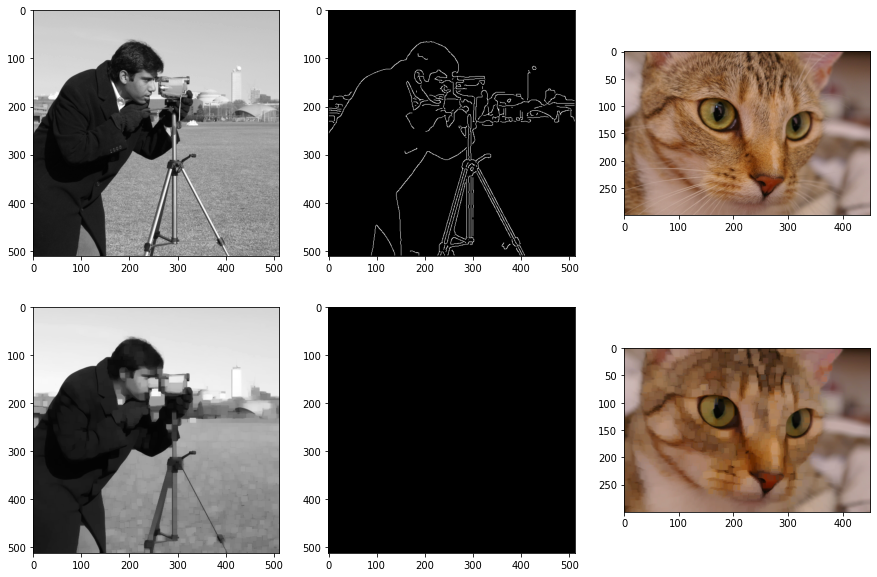

In [23]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(apertura(img_gray, se_box), 'gray')
axes[1,1].imshow(apertura(img_bin, se_box), 'gray')
axes[1,2].imshow(apertura(img_rgb, se_box))

2. Cierre (closing, dilatación seguida por erosión):

In [24]:
def cierre(img,se):
  return im_erosion(im_dilate(img,se),se)

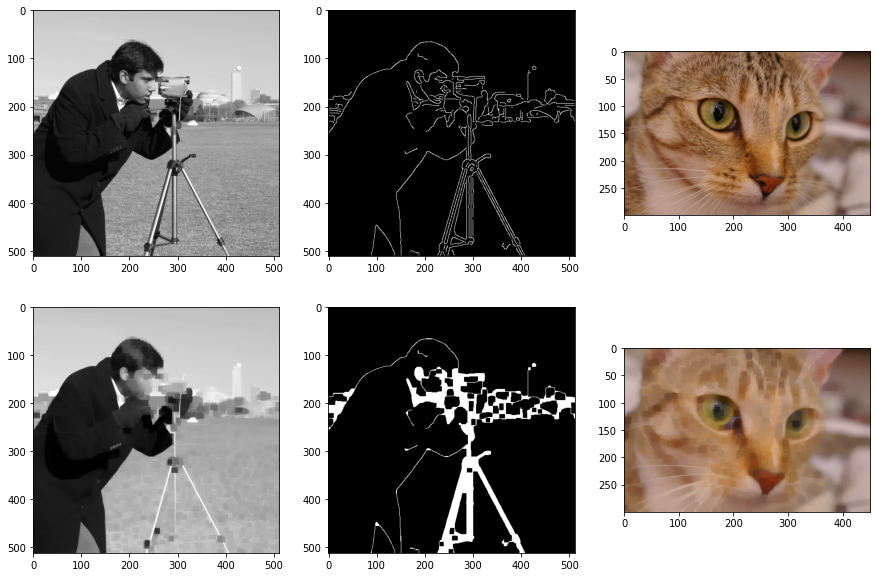

In [25]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(cierre(img_gray, se_box), 'gray')
axes[1,1].imshow(cierre(img_bin, se_box), 'gray')
axes[1,2].imshow(cierre(img_rgb, se_box))

3. Top-hat (imagen menos apertura)


In [26]:
def top_hat(img,se):
  return img-apertura(img,se)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


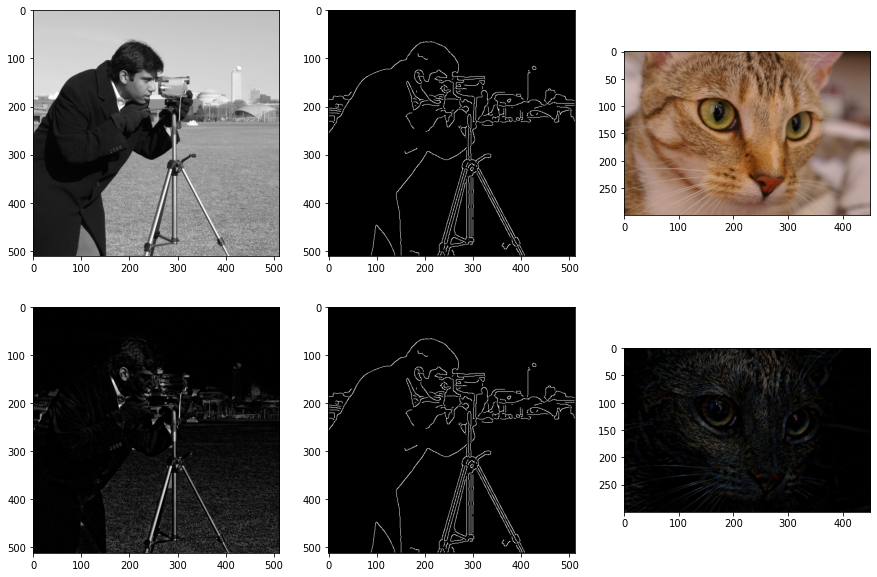

In [27]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(top_hat(img_gray, se_box), 'gray')
axes[1,1].imshow(top_hat(img_bin, se_box), 'gray')
axes[1,2].imshow(top_hat(img_rgb, se_box))

4. Bottom-hat(cierre menos imagen)

In [28]:
def bottom_hat(img,se):
  return cierre(img,se)-img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


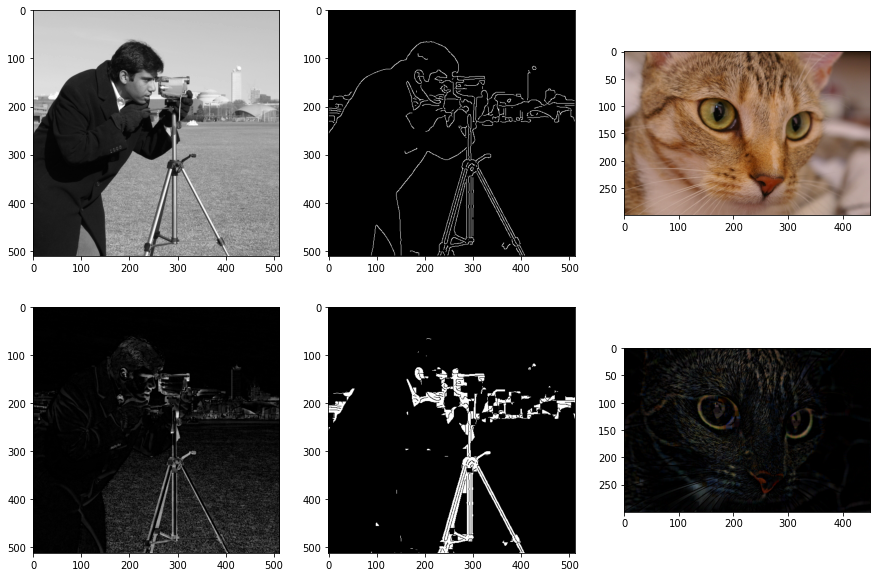

In [29]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(bottom_hat(img_gray, se_box), 'gray')
axes[1,1].imshow(bottom_hat(img_bin, se_box), 'gray')
axes[1,2].imshow(bottom_hat(img_rgb, se_box))

# 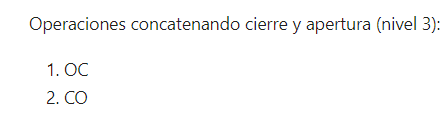

1. OC (opening*closing)=(apertura*cierre)

In [30]:
def apertura_cierre(img,se):
  return cierre(apertura(img,se),se)

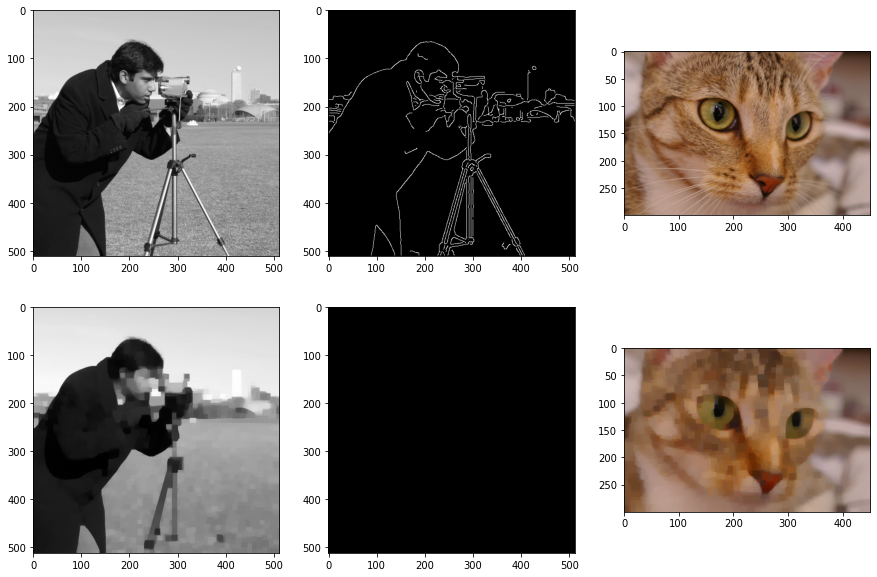

In [31]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(apertura_cierre(img_gray, se_box), 'gray')
axes[1,1].imshow(apertura_cierre(img_bin, se_box), 'gray')
axes[1,2].imshow(apertura_cierre(img_rgb, se_box))

2. CO (closing*opening)=(cierre*apertura)

In [32]:
def cierre_apertura(img,se):
  return apertura(cierre(img,se),se)

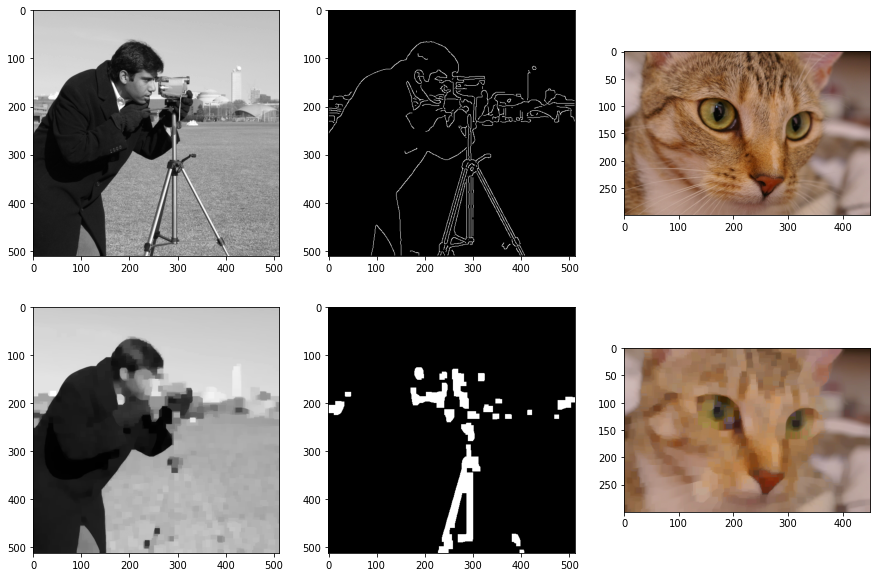

In [33]:
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(cierre_apertura(img_gray, se_box), 'gray')
axes[1,1].imshow(cierre_apertura(img_bin, se_box), 'gray')
axes[1,2].imshow(cierre_apertura(img_rgb, se_box))

# 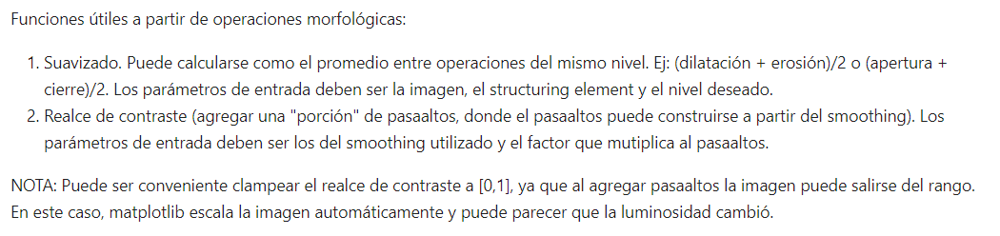

1. Suavizado

In [34]:
def suavizado(img,se,nivel):
  if nivel==1:
    aux=(im_dilate(img,se)+im_erosion(img,se))/2
  else: 
    if nivel==2:
      aux=(apertura(img,se)+cierre(img,se))/2
    else:
      if nivel==3:
        aux=(apertura_cierre(img,se)+cierre_apertura(img,se))/2
      else:
        print("Ingrese un nivel valido, entre 1 y 3")
        return str("Error")
  return aux

A continuación se muestran los resultados por nivel:

Nivel 1

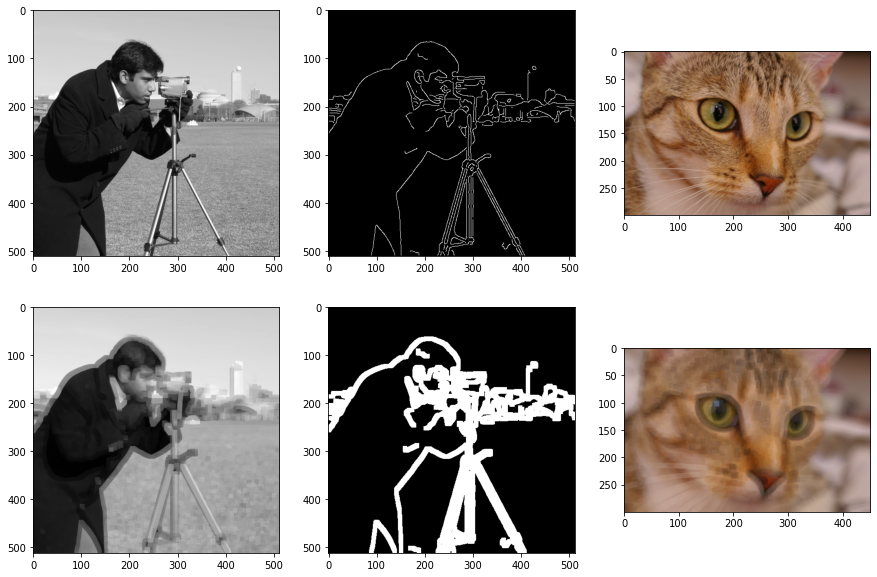

In [35]:
nivel=1
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(suavizado(img_gray, se_box, nivel), 'gray')
axes[1,1].imshow(suavizado(img_bin, se_box,  nivel), 'gray')
axes[1,2].imshow(suavizado(img_rgb, se_box,  nivel))

Nivel 2

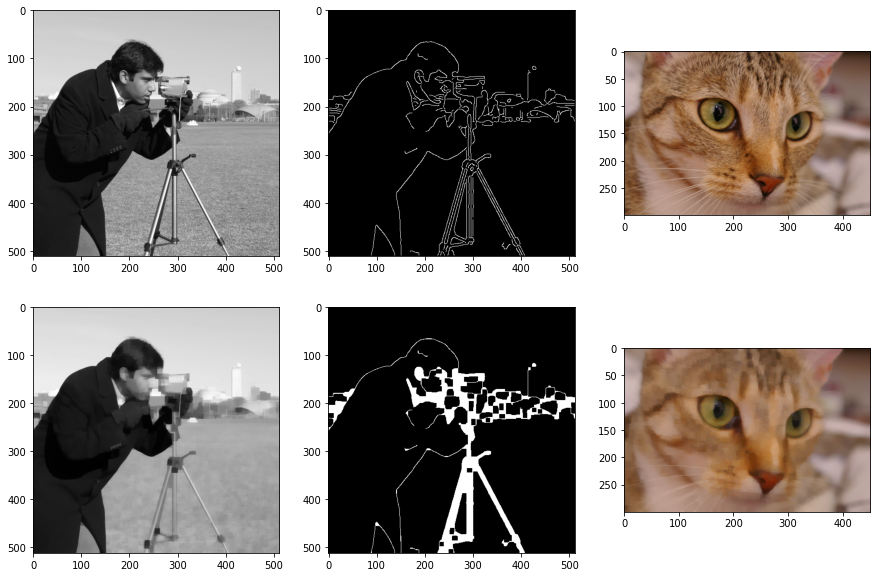

In [36]:
nivel=2
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(suavizado(img_gray, se_box, nivel), 'gray')
axes[1,1].imshow(suavizado(img_bin, se_box,  nivel), 'gray')
axes[1,2].imshow(suavizado(img_rgb, se_box,  nivel))

Nivel 3

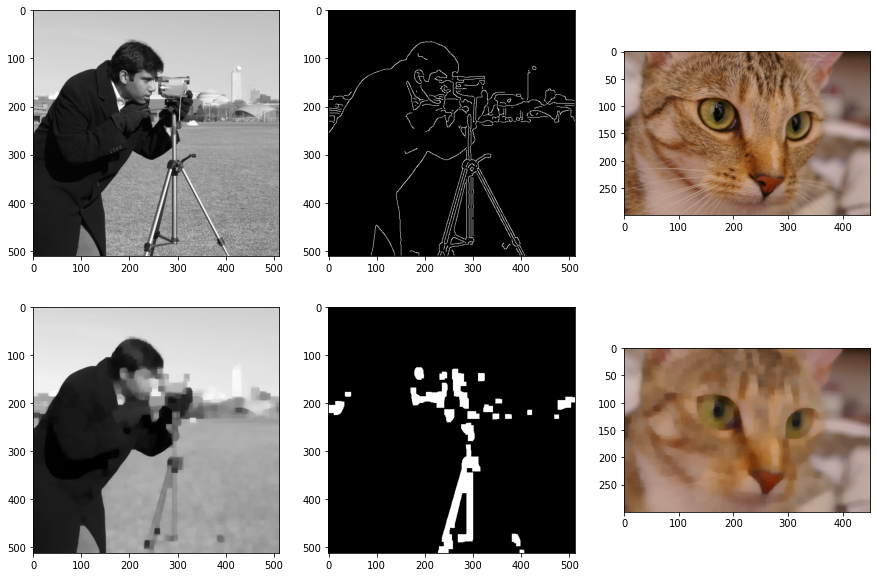

In [37]:
nivel=3
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(suavizado(img_gray, se_box, nivel), 'gray')
axes[1,1].imshow(suavizado(img_bin, se_box,  nivel), 'gray')
axes[1,2].imshow(suavizado(img_rgb, se_box,  nivel))

2. Realce de contraste

In [38]:
def contraste(img,se,nivel,factor):
  if nivel==1:
    aux=(im_dilate(img,se)+im_erosion(img,se))/2
  else: 
    if nivel==2:
      aux=(apertura(img,se)+cierre(img,se))/2
    else:
      if nivel==3:
        aux=(apertura_cierre(img,se)+cierre_apertura(img,se))/2
      else:
        print("Ingrese un nivel valido, entre 1 y 3")
        aux=str("Error")
        return aux
  res=np.clip(factor*(img-aux)+img, 0, 1)
  return res

Nivel 1

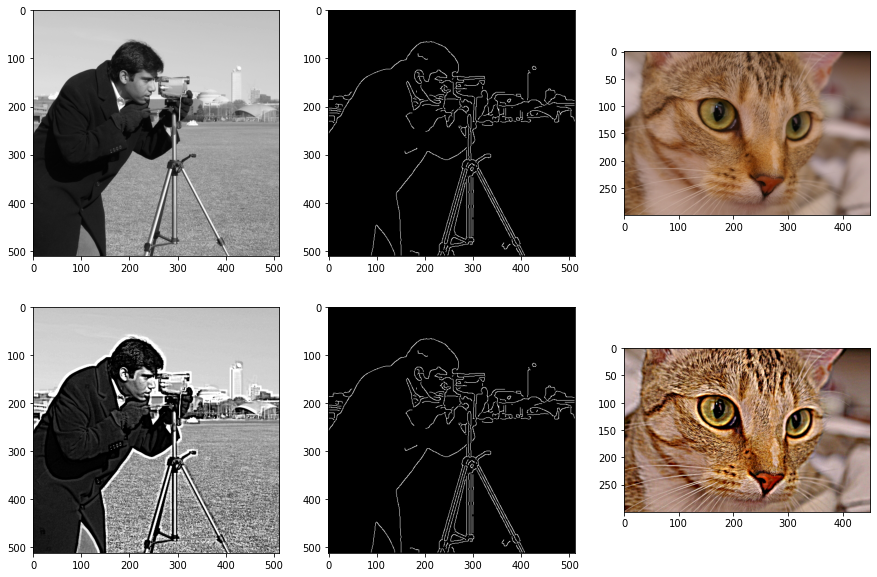

In [39]:
nivel=1
factor=2

fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(contraste(img_gray, se_box, nivel, factor), 'gray')
axes[1,1].imshow(contraste(img_bin, se_box,  nivel, factor), 'gray')
axes[1,2].imshow(contraste(img_rgb, se_box,  nivel, factor))

Nivel 2

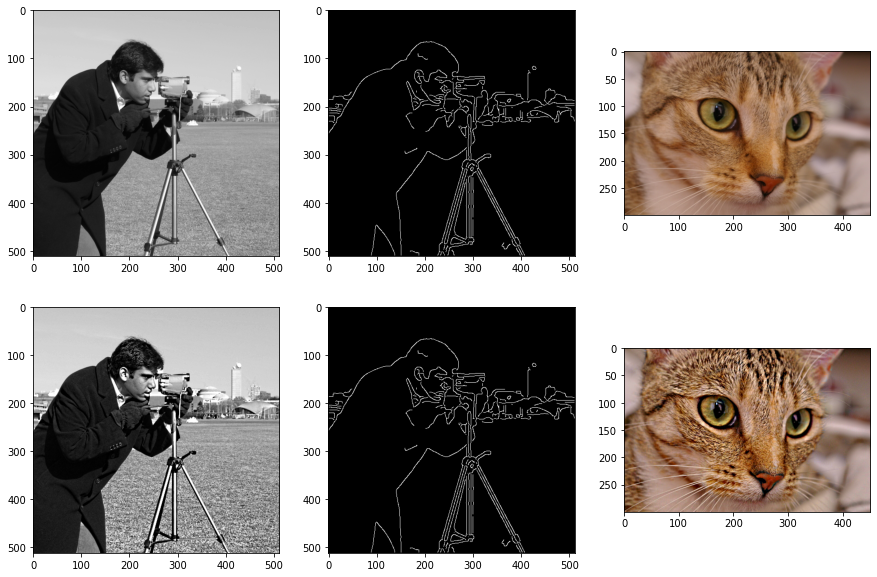

In [40]:
nivel=2
factor=2

fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(contraste(img_gray, se_box, nivel, factor), 'gray')
axes[1,1].imshow(contraste(img_bin, se_box,  nivel, factor), 'gray')
axes[1,2].imshow(contraste(img_rgb, se_box,  nivel, factor))

Nivel 3

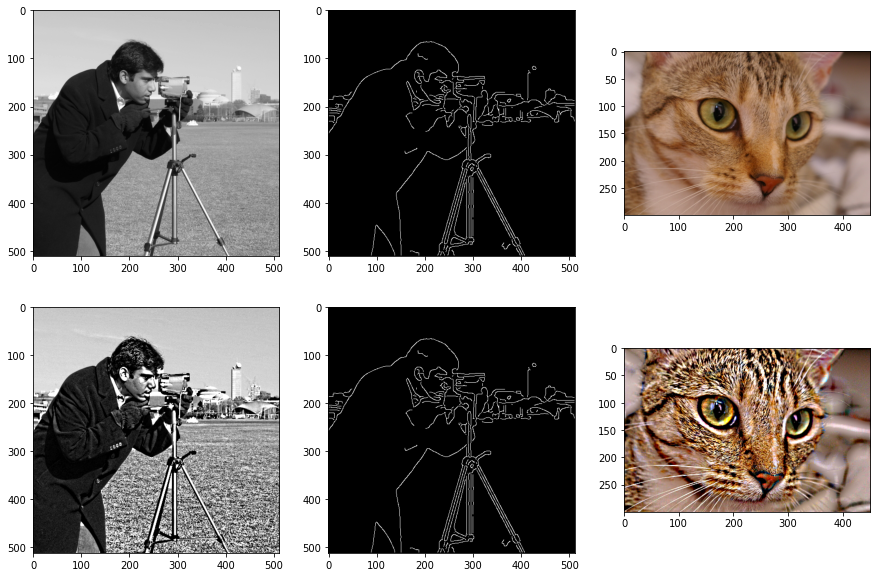

In [41]:
nivel=3
factor=5

fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(img_bin, 'gray')
axes[0,2].imshow(img_rgb)
axes[1,0].imshow(contraste(img_gray, se_box, nivel, factor), 'gray')
axes[1,1].imshow(contraste(img_bin, se_box,  nivel, factor), 'gray')
axes[1,2].imshow(contraste(img_rgb, se_box,  nivel, factor))

#Aplicaciones útiles:
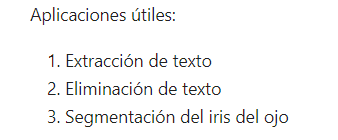

1. Extracción de texto

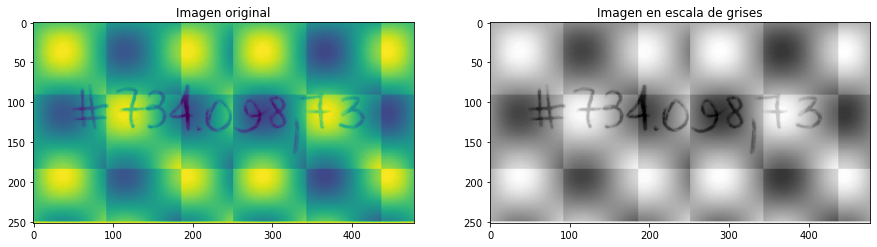

In [55]:
import imageio 
img_text=imageio.imread('text.png')/255

fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].set_title("Imagen original")
axes[0].imshow(img_text)
axes[1].set_title("Imagen en escala de grises")
axes[1].imshow(img_text, 'gray')

In [56]:
def extraccion(img, se, umbral):
  res_img=bottom_hat(img, se)  #Con este paso ya me quedo con el texto
  #En el siguiente le doy contraste poniendole 0 o 1
  res_img[res_img<umbral]=0
  res_img[res_img>=umbral]=1  
  return res_img

Aplicando estructura box

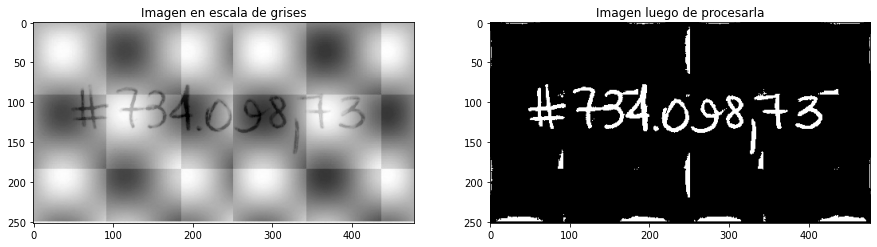

In [65]:
umbral=0.03

res_img=extraccion(img_text,se_box,umbral)


fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].set_title("Imagen en escala de grises")
axes[0].imshow(img_text, 'gray')
axes[1].set_title("Imagen luego de procesarla")
axes[1].imshow(res_img, 'gray')

Aplicando estructura circle

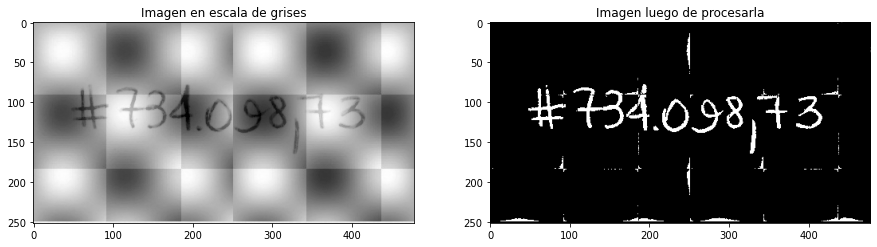

In [67]:
umbral=0.05

res_img=extraccion(img_text,se_circle,umbral)


fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].set_title("Imagen en escala de grises")
axes[0].imshow(img_text, 'gray')
axes[1].set_title("Imagen luego de procesarla")
axes[1].imshow(res_img, 'gray')

2. Eliminación de texto

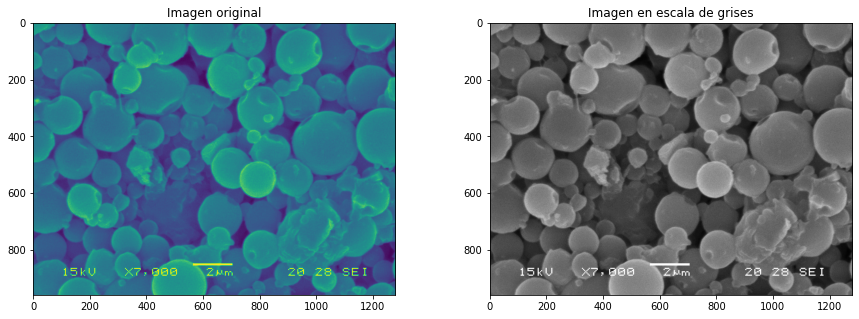

In [69]:
particles=imageio.imread('particles.png')/255

fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].set_title("Imagen original")
axes[0].imshow(particles)
axes[1].set_title("Imagen en escala de grises")
axes[1].imshow(particles, 'gray')

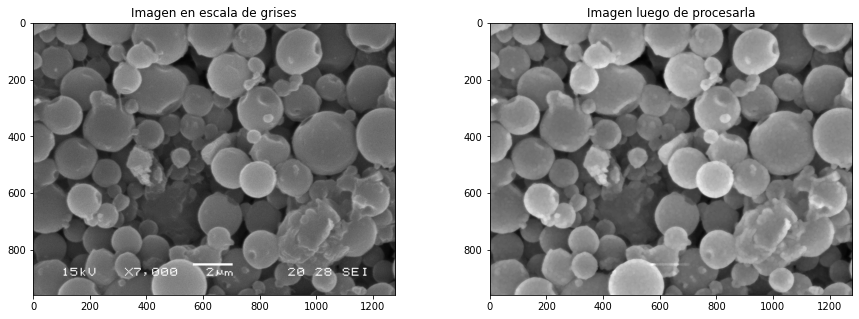

In [77]:
#Un se más potente
se_circle=Kernel_Circle(15)
se_circle=kernel_circle>0

res_image=apertura(particles,se_circle)

fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].set_title("Imagen en escala de grises")
axes[0].imshow(particles, 'gray')
axes[1].set_title("Imagen luego de procesarla")
axes[1].imshow(res_image, 'gray')

3. Segmentación del iris del ojo

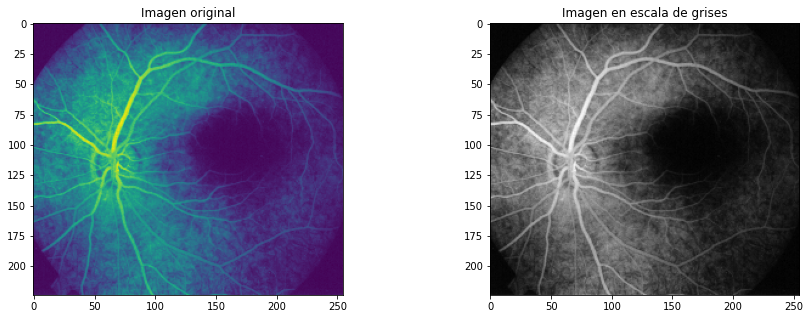

In [79]:
iris=imageio.imread('iris.bmp')/255

fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].set_title("Imagen original")
axes[0].imshow(iris)
axes[1].set_title("Imagen en escala de grises")
axes[1].imshow(iris, 'gray')

In [80]:
def segmentacion(img, se, umbral):
  res_img=top_hat(img, se)  #Con este paso ya me quedo con la info
  #En el siguiente le doy contraste poniendole 0 o 1
  res_img[res_img<umbral]=0
  res_img[res_img>=umbral]=1  
  return res_img

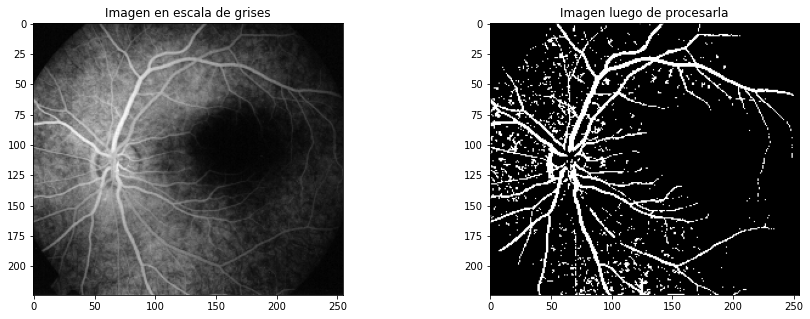

In [88]:
umbral=0.065
res_img=segmentacion(iris,se_circle,umbral)


fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].set_title("Imagen en escala de grises")
axes[0].imshow(iris, 'gray')
axes[1].set_title("Imagen luego de procesarla")
axes[1].imshow(res_img, 'gray')